# Data from Barrett et al. (2023) Human VS fresh samples

## Import packages

In [1]:
import anndata
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
from sklearn.decomposition import TruncatedSVD
from scipy import sparse, io
import seaborn as sns
#import glob2 as glob
%matplotlib inline
import scrublet as scr
import scipy.io
import os
import anndata as ad
import re
import palantir

matplotlib.rcParams.update({'font.size': 12})
%config InlineBackend.figure_format = 'retina'

## Figure setting

In [77]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
plt.rcParams['axes.grid'] = False 
sc.settings.set_figure_params(dpi=80, facecolor='white', color_map='viridis', frameon=False, figsize=(4, 4))

## Download the data
### Source：GSE216783 https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE216783

In [3]:
file_path = '/Users/ruiqizhou/Desktop/Vestibular_Schwannoma/sch.all.counts.tsv'
data = pd.read_csv(file_path, sep='\t', index_col=0)

In [4]:
data = data.T

In [5]:
adata = ad.AnnData(data)

In [6]:
adata

AnnData object with n_obs × n_vars = 112728 × 9254

## Check the quality

### Cell Quality looks good, we will keep all cells 

In [7]:
# mitochondrial genes
adata.var["mt"] = adata.var_names.str.startswith("MT-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes.
adata.var["hb"] = adata.var_names.str.contains(("^HB[^(p)]"))

In [8]:
#We can now calculate the respective QC metrics with scanpy.
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, percent_top=[20], log1p=True
)
adata

AnnData object with n_obs × n_vars = 112728 × 9254
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

In [9]:
# make genes name unique
adata.var_names_make_unique()

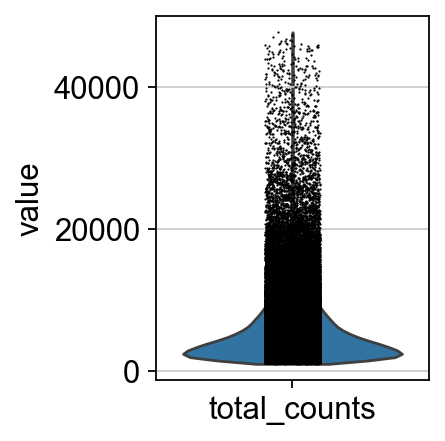

In [14]:
# check total_counts
sc.pl.violin(adata, "total_counts")

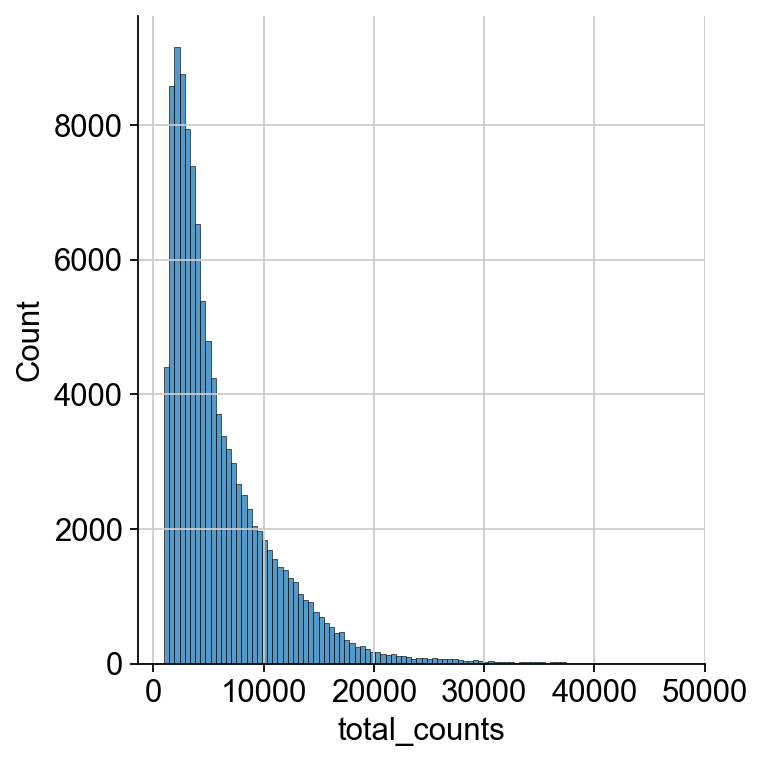

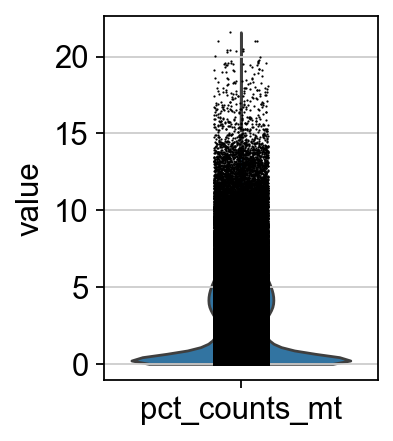

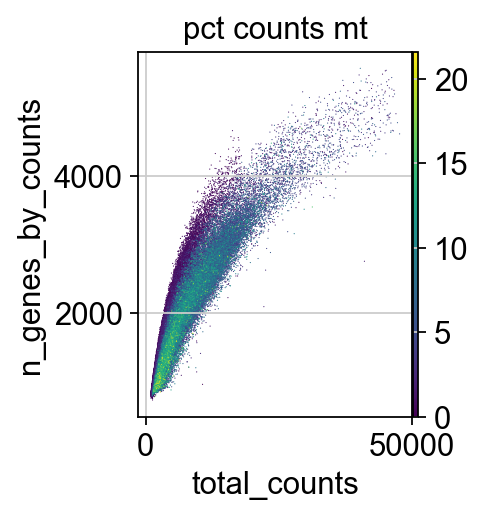

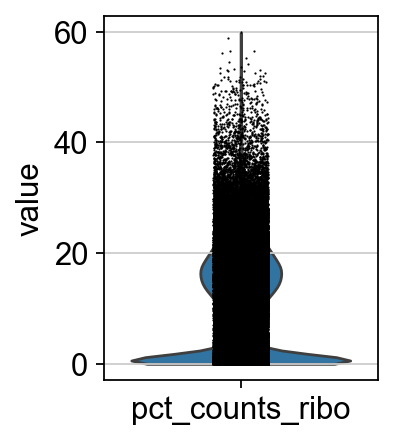

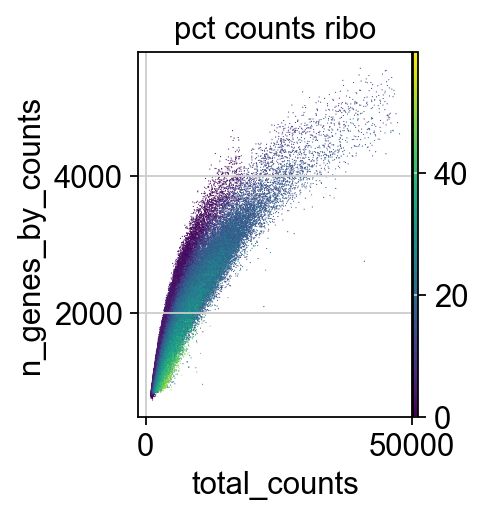

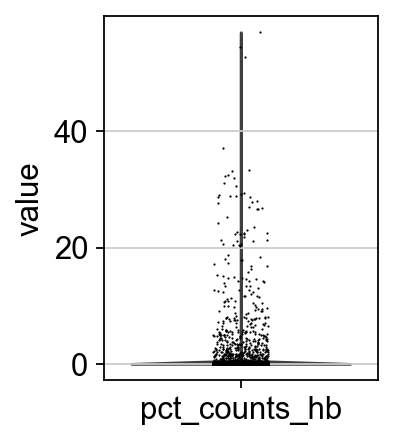

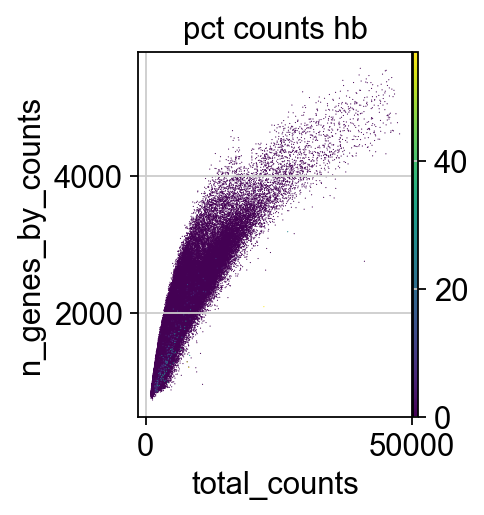

In [15]:
# We now plot the three QC covariates n_genes_by_counts, 
# total_counts and pct_counts_mt per sample to assess how well the respective cells were captured.
p1 = sns.displot(adata.obs["total_counts"], bins=100, kde=False)
p2 = sc.pl.violin(adata, "pct_counts_mt")
p3 = sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")
p4 = sc.pl.violin(adata, "pct_counts_ribo")
p5 = sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_ribo")
p6 = sc.pl.violin(adata, "pct_counts_hb")
p7 = sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_hb")

## Extract batch names from gene identifiers and store them in a new column

In [18]:
adata.obs['batch'] = adata.obs.index.to_series().str.extract(r'(SCH\d+)')[0]
adata.obs[['batch']]

,batch
SCH1_TACGGTACACACAGAG-1,SCH1
SCH1_TACTTGTGTACTAGCT-1,SCH1
SCH1_CTACTATAGCTAAATG-1,SCH1
SCH1_CAGCAATGTAGGCTCC-1,SCH1
SCH1_TGATTTCAGGACAAGA-1,SCH1
...,...
SCH22_ATTCAGGCAATACGAA-1,SCH22
SCH22_GGTAGAGGTGAGTCAG-1,SCH22
SCH22_CTCATCGCATACGCAT-1,SCH22
SCH22_GGGTCTGGTTGATCGT-1,SCH22


In [19]:
adata.obs['batch'].unique()

array(['SCH1', 'SCH2', 'SCH3', 'SCH4', 'SCH5', 'SCH6', 'SCH7', 'SCH8',
       'SCH9', 'SCH13', 'SCH14', 'SCH18', 'SCH20', 'SCH21', 'SCH22'],
      dtype=object)

## Subet the Fresh samples

In [20]:
Fresh_Subset_data = adata[(adata.obs['batch'] == 'SCH1') | (adata.obs['batch'] == 'SCH2')| (adata.obs['batch'] == 'SCH3')| (adata.obs['batch'] == 'SCH4')| (adata.obs['batch'] == 'SCH5')| (adata.obs['batch'] == 'SCH6')| (adata.obs['batch'] == 'SCH9')| (adata.obs['batch'] == 'SCH13')| (adata.obs['batch'] == 'SCH14')].copy()

In [21]:
Fresh_Subset_data

AnnData object with n_obs × n_vars = 63931 × 9254
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'batch'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

## Read the data annoatation and match to the matrix

In [22]:
df = pd.read_csv('/Users/ruiqizhou/Desktop/Vestibular_Schwannoma/barrett_et_al_annotations.csv')

In [23]:
df

,barcode,orig.ident,nCount_RNA,nFeature_RNA,percent.mito,technique,S.Score,G2M.Score,Phase,percent.ribo,seurat_clusters,final_label,chr22q_loss
0,SCH1_TACGGTACACACAGAG-1,SCH1,46216,5278,0.042412,fresh,-0.620999,-0.934053,G1,0.139078,16,nmSC,1
1,SCH1_TACTTGTGTACTAGCT-1,SCH1,45234,5385,0.037596,fresh,-0.504294,-1.327833,G1,0.062062,5,nmSC,1
2,SCH1_CTACTATAGCTAAATG-1,SCH1,44976,5247,0.004951,fresh,-0.941062,-2.561779,G1,0.170861,21,Endothelial,0
3,SCH1_CAGCAATGTAGGCTCC-1,SCH1,44211,5349,0.035000,fresh,-0.754879,-0.457325,G1,0.108736,5,nmSC,1
4,SCH1_TGATTTCAGGACAAGA-1,SCH1,43303,5237,0.037903,fresh,-0.622560,-0.989206,G1,0.095872,16,nmSC,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
112723,SCH22_ATTCAGGCAATACGAA-1,SCH22,1107,833,0.004626,frozen,0.008910,0.031718,G2M,0.001542,0,Myeloid,0
112724,SCH22_GGTAGAGGTGAGTCAG-1,SCH22,1083,822,0.001526,frozen,-0.021203,-0.006743,G1,0.000763,0,Myeloid,0
112725,SCH22_CTCATCGCATACGCAT-1,SCH22,1144,823,0.000000,frozen,0.008337,-0.024119,S,0.000741,0,Myeloid,0
112726,SCH22_GGGTCTGGTTGATCGT-1,SCH22,1046,811,0.004792,frozen,0.009483,-0.007671,S,0.005591,0,Myeloid,0


In [24]:
df['technique']

0          fresh
1          fresh
2          fresh
3          fresh
4          fresh
           ...  
112723    frozen
112724    frozen
112725    frozen
112726    frozen
112727    frozen
Name: technique, Length: 112728, dtype: object

In [25]:
df['orig.ident'].value_counts()

orig.ident
SCH4     14602
SCH13    13102
SCH21    11608
SCH22    10481
SCH20     9083
SCH18     7799
SCH6      7651
SCH2      7082
SCH14     6271
SCH8      5570
SCH1      5074
SCH7      4256
SCH5      4169
SCH9      3994
SCH3      1986
Name: count, dtype: int64

In [26]:
df['barcode'] = df['barcode'].astype(str).str.strip()

In [27]:
df.set_index('barcode', inplace=True)

In [28]:
Fresh_Subset_data.obs['final_label'] = df['final_label']

In [30]:
Fresh_Subset_data.obs

,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,total_counts_hb,log1p_total_counts_hb,pct_counts_hb,batch,final_label
SCH1_TACGGTACACACAGAG-1,5278,8.571492,46216,10.741103,19.028042,2102,7.651120,4.548208,6889,8.837826,14.906093,9,2.302585,0.019474,SCH1,nmSC
SCH1_TACTTGTGTACTAGCT-1,5385,8.591558,45234,10.719626,21.302560,1847,7.521859,4.083212,3042,8.020599,6.725030,20,3.044522,0.044215,SCH1,nmSC
SCH1_CTACTATAGCTAAATG-1,5247,8.565602,44976,10.713907,14.485503,242,5.493061,0.538065,8346,9.029657,18.556564,8,2.197225,0.017787,SCH1,Endothelial
SCH1_CAGCAATGTAGGCTCC-1,5349,8.584852,44211,10.696752,19.099319,1667,7.419381,3.770555,5174,8.551595,11.702970,7,2.079442,0.015833,SCH1,nmSC
SCH1_TGATTTCAGGACAAGA-1,5237,8.563695,43303,10.676000,18.793155,1751,7.468513,4.043600,4428,8.395929,10.225619,38,3.663562,0.087754,SCH1,nmSC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SCH14_ATCTTCAGTATAATGG-1,860,6.758095,1720,7.450661,24.825581,41,3.737670,2.383721,275,5.620401,15.988372,0,0.000000,0.000000,SCH14,NKC
SCH14_GTGCACGGTGGCTTGC-1,851,6.747587,1636,7.400621,35.757946,267,5.590987,16.320293,43,3.784190,2.628362,0,0.000000,0.000000,SCH14,Myeloid
SCH14_TCGCACTGTACTTGTG-1,956,6.863803,1622,7.392032,17.694205,111,4.718499,6.843403,126,4.844187,7.768187,0,0.000000,0.000000,SCH14,NKC
SCH14_CTCACTGTCTCCCATG-1,923,6.828712,1666,7.418781,19.747899,58,4.077537,3.481393,176,5.176150,10.564226,2,1.098612,0.120048,SCH14,Myeloid


## Normalization

In [31]:
#Shifted logarithm
scales_counts = sc.pp.normalize_total(Fresh_Subset_data, target_sum=None, inplace=False)
# log1p transform
Fresh_Subset_data.layers["log1p_norm"] = sc.pp.log1p(scales_counts["X"], copy=True)

normalizing counts per cell
    finished (0:00:02)


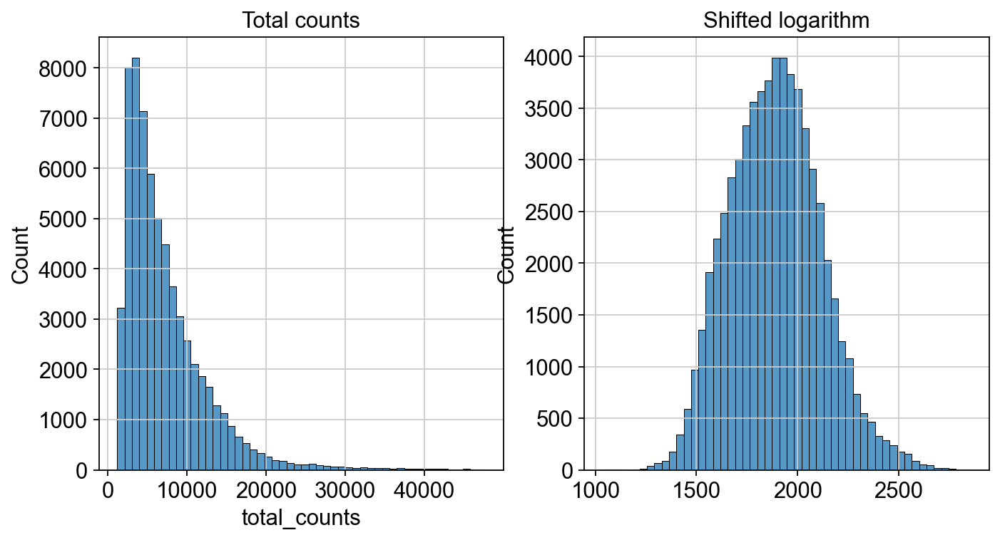

In [32]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
p1 = sns.histplot(Fresh_Subset_data.obs["total_counts"], bins=50, kde=False, ax=axes[0])
axes[0].set_title("Total counts")
p2 = sns.histplot(Fresh_Subset_data.layers["log1p_norm"].sum(1), bins=50, kde=False, ax=axes[1])
axes[1].set_title("Shifted logarithm")
plt.show()

In [33]:
sc.pp.normalize_total(Fresh_Subset_data)

normalizing counts per cell
    finished (0:00:01)


In [34]:
Fresh_Subset_data

AnnData object with n_obs × n_vars = 63931 × 9254
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'batch', 'final_label'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'log1p_norm'

## Feature selection

In [35]:
sc.pp.log1p(Fresh_Subset_data, base=2)

In [36]:
sc.pp.highly_variable_genes(Fresh_Subset_data, min_mean=0.0125, max_mean=3, min_disp=0.5, n_top_genes=3000)

extracting highly variable genes
    finished (0:00:04)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [37]:
sc.tl.pca(Fresh_Subset_data, use_highly_variable= True)

computing PCA
    with n_comps=50


/Users/ruiqizhou/miniconda3/envs/your_env_name/lib/python3.9/site-packages/scanpy/preprocessing/_pca.py:377: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


    finished (0:00:05)


In [38]:
%%time
sc.external.pp.bbknn(Fresh_Subset_data, batch_key='batch')  # running bbknn 1.3.6

computing batch balanced neighbors


/Users/ruiqizhou/miniconda3/envs/your_env_name/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


	finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:11)
CPU times: user 14.4 s, sys: 2.1 s, total: 16.5 s
Wall time: 15.7 s


In [39]:
sc.tl.umap(Fresh_Subset_data)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:42)


In [40]:
sc.tl.leiden(Fresh_Subset_data)

running Leiden clustering


/var/folders/tf/y2q7s_zj6hv3yd95924kqzs40000gn/T/ipykernel_14430/1257402586.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(Fresh_Subset_data)


    finished: found 16 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:02:41)


/Users/ruiqizhou/miniconda3/envs/cellbender/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


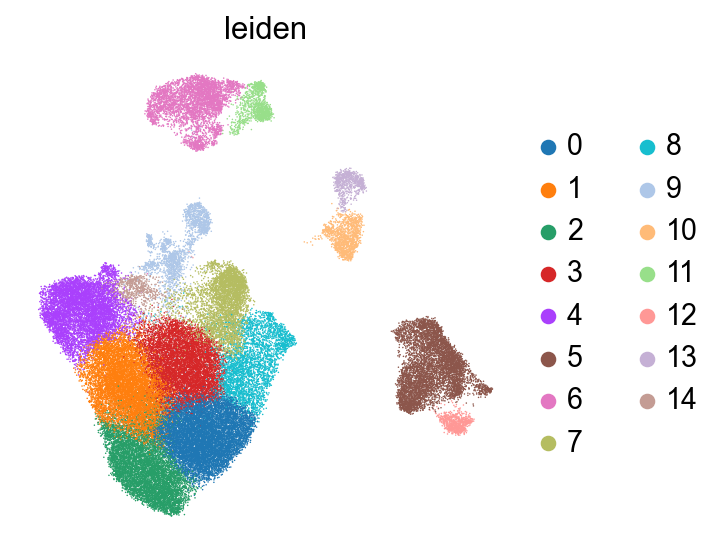

In [ ]:
sc.pl.umap(Fresh_Subset_data, color=['leiden'])

In [ ]:
Fresh_Subset_data.obs['final_label'] = df['final_label']

In [ ]:
Fresh_Subset_data.obs.loc[Fresh_Subset_data.obs['leiden'] == '12', 'final_label'] = 'myeSC'

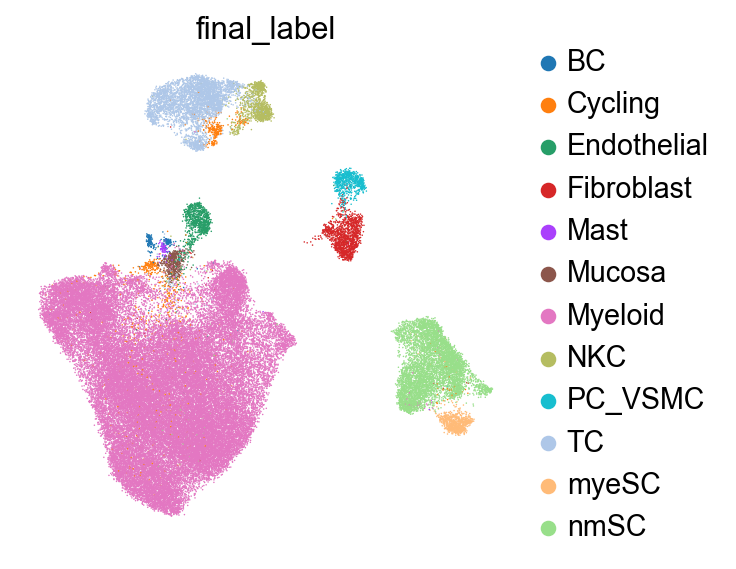

In [ ]:
## cell annotation from Barrett et al. manuscript used here
sc.pl.umap(Fresh_Subset_data, color=['final_label'])

## Gene expression for each group (confirm gene expression for annotated groups based on marker genes from Barrett et la.)

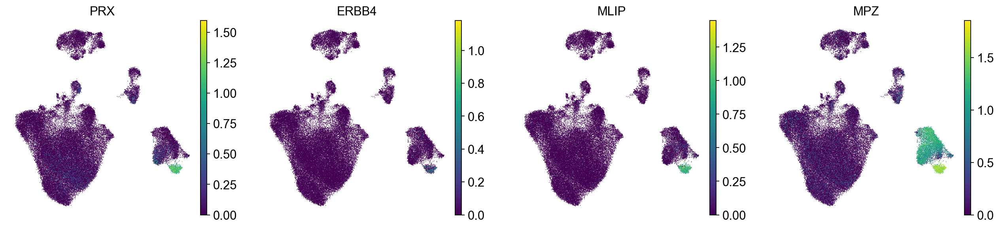

In [ ]:
sc.pl.umap(Fresh_Subset_data, color=[#myeSC
"PRX", "ERBB4","MLIP", "MPZ"],use_raw=False)

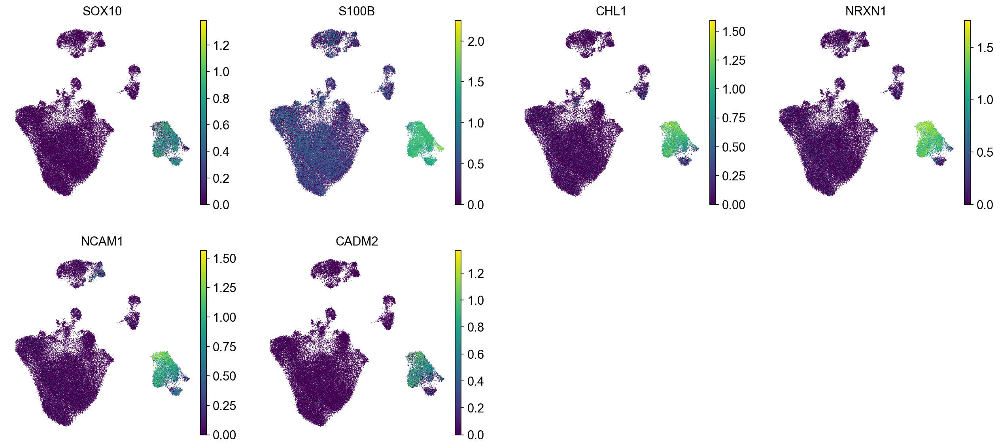

In [ ]:
sc.pl.umap(Fresh_Subset_data, color=[# nmSC
"SOX10","S100B",'CHL1', "NRXN1","NCAM1","CADM2",],use_raw=False)

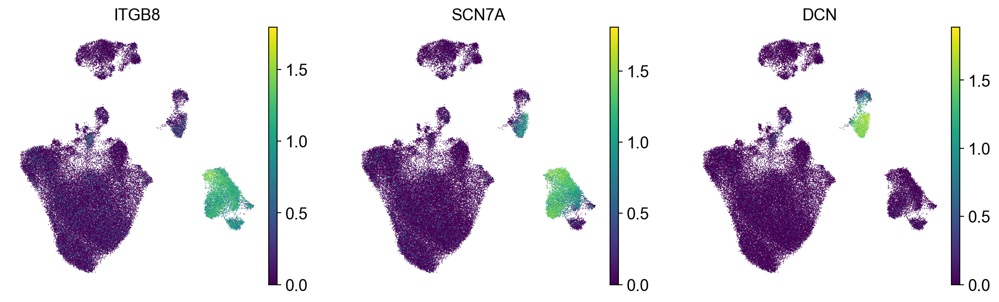

In [ ]:
sc.pl.umap(Fresh_Subset_data, color=[# fibroblast
'ITGB8',"SCN7A",'DCN'],use_raw=False)

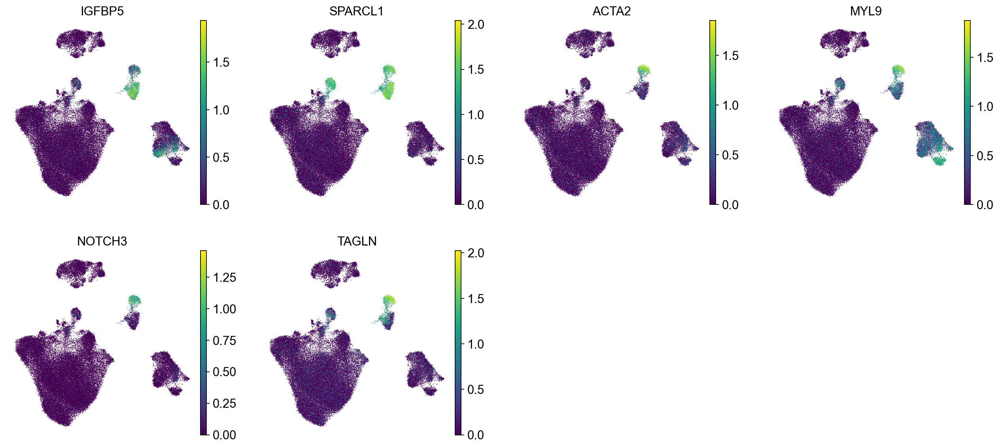

In [ ]:
sc.pl.umap(Fresh_Subset_data, color=[#PC/VSMC
"IGFBP5",'SPARCL1',"ACTA2","MYL9",'NOTCH3','TAGLN'],use_raw=False)

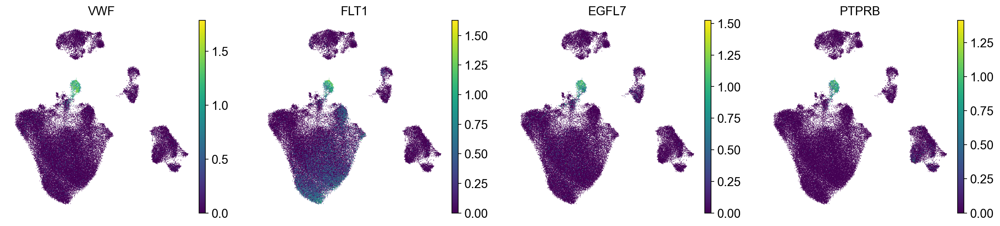

In [ ]:
sc.pl.umap(Fresh_Subset_data, color=[#Endothelial
"VWF",'FLT1',"EGFL7","PTPRB",],use_raw=False)

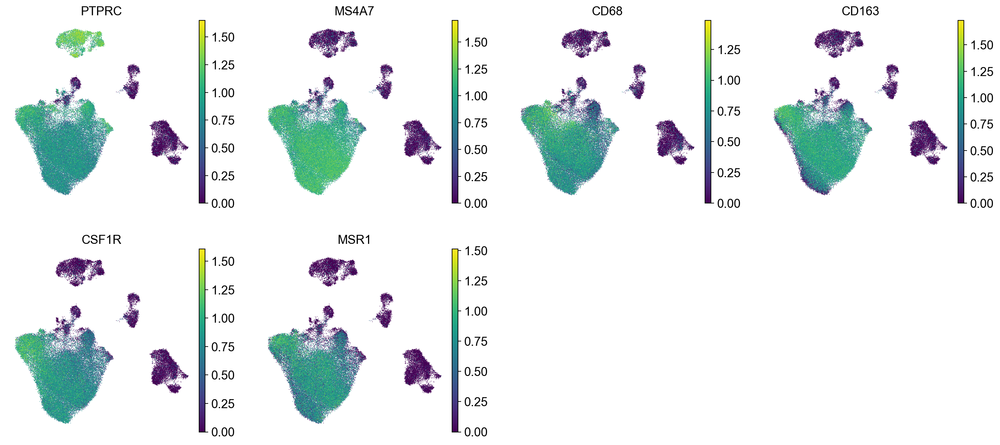

In [ ]:
sc.pl.umap(Fresh_Subset_data, color=[#Myeloid
"PTPRC","MS4A7","CD68","CD163","CSF1R",'MSR1'],use_raw=False)

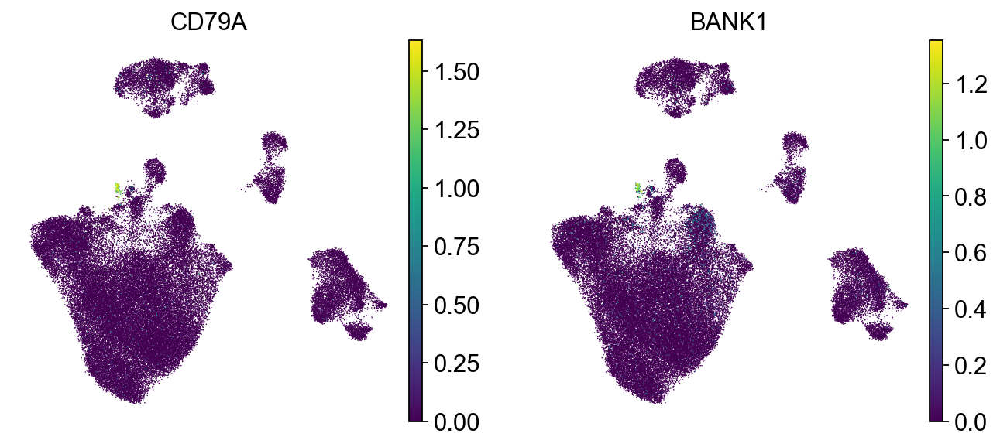

In [ ]:
sc.pl.umap(Fresh_Subset_data, color=[#B/Plasma
'CD79A',"BANK1",],use_raw=False)

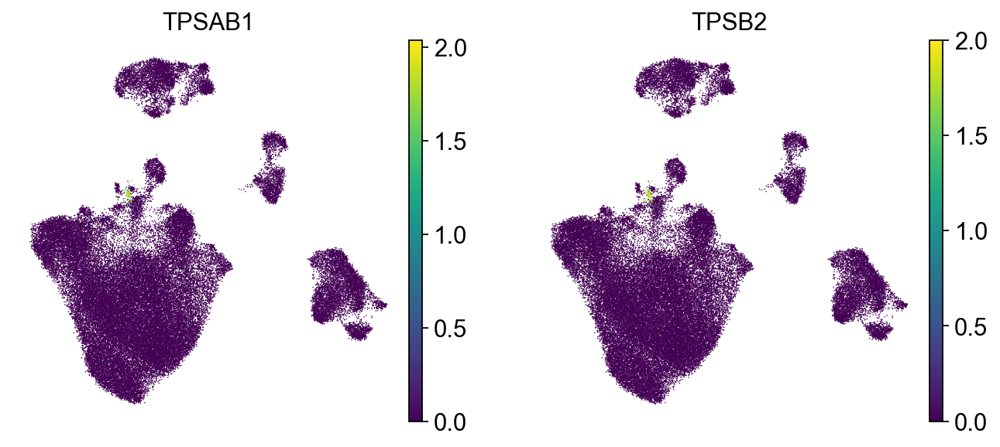

In [ ]:
sc.pl.umap(Fresh_Subset_data, color=[# Mast
"TPSAB1",'TPSB2'],use_raw=False)

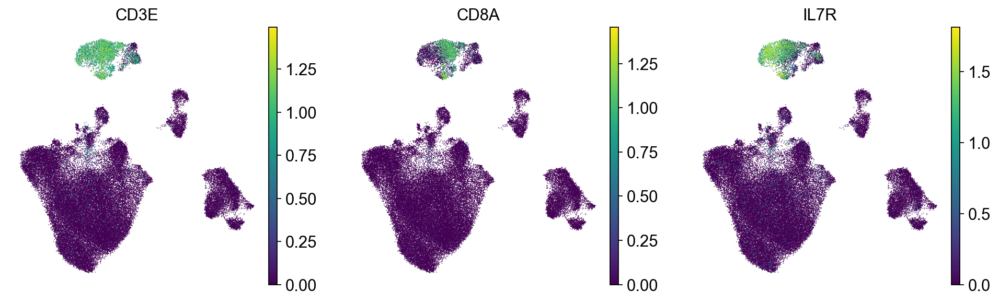

In [ ]:
sc.pl.umap(Fresh_Subset_data, color=[#T cell
"CD3E",'CD8A','IL7R'],use_raw=False)

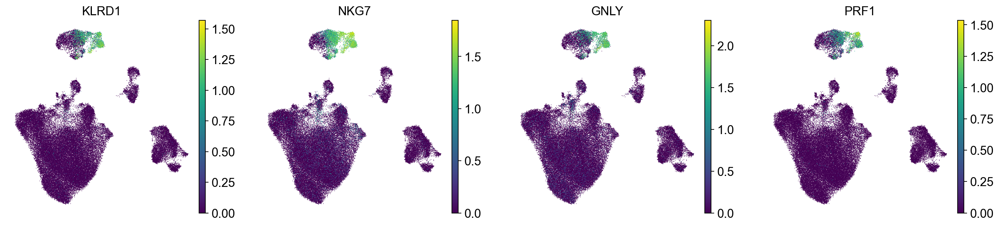

In [ ]:
sc.pl.umap(Fresh_Subset_data, color=[# NK cell
"KLRD1","NKG7","GNLY","PRF1"],use_raw=False)

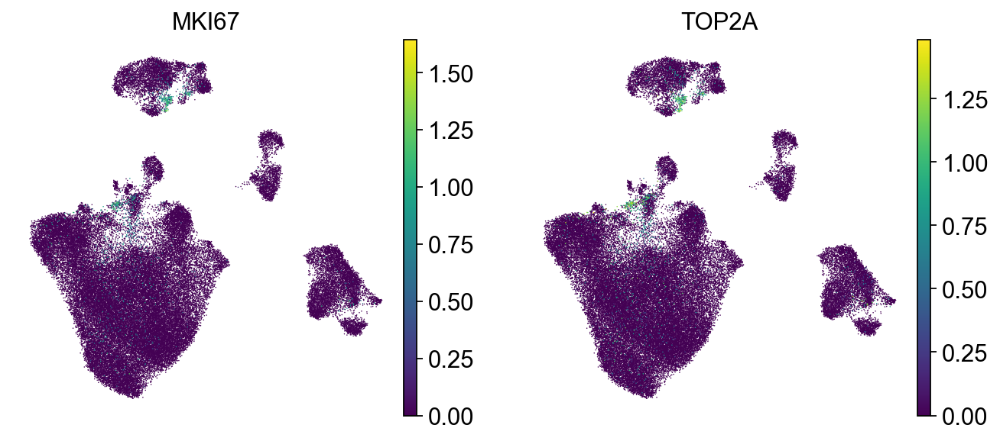

In [ ]:
sc.pl.umap(Fresh_Subset_data, color=[# cycling
"MKI67","TOP2A"],use_raw=False)

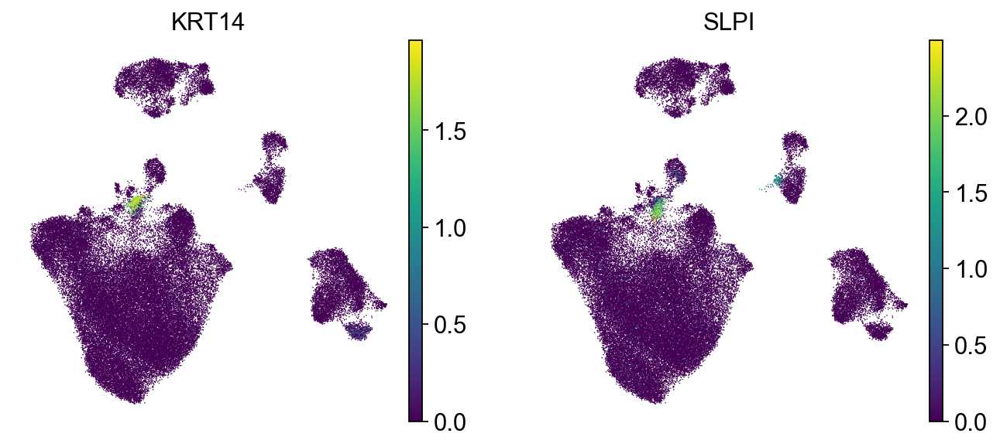

In [ ]:
sc.pl.umap(Fresh_Subset_data, color=[# Mucosa
"KRT14", "SLPI"],use_raw=False)

## Check CDH2 log2 expression

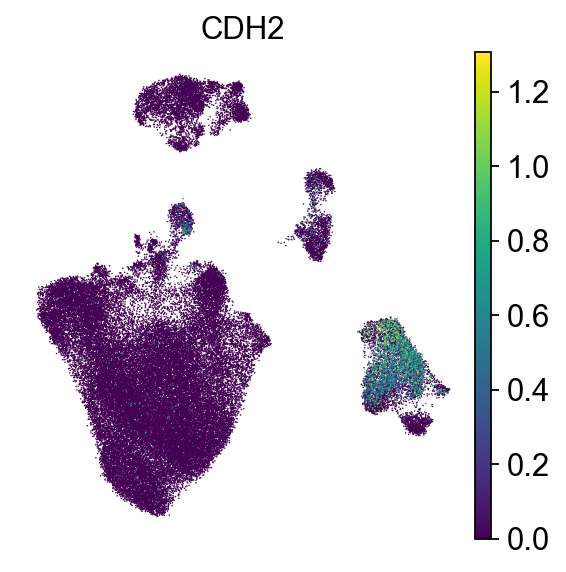

In [78]:
sc.pl.umap(Fresh_Subset_data, color=["CDH2"],use_raw=False)